## Sub-Regional average road fuels sales,deliveries and stock level at the Filling station

## 1. DataSet Selection

### Why this dataset?

 I chose this dataset from data.gov.uk because it provides a comprehensive and a recent data on Sub-Regional metrics, which makes it a ideal to analyze the future trends using the present data and also to analyze the pattern across the regions. Its structured data format makes it suitable for diverse 
analytical techniques ensuring the relevance to real-world application. Additionally, using open government data ensures reliablilty and supports  learning  with authentic data sources.


## 2. Data Preparation and Exploration


## Step 1: Import the necessary libraries

In [138]:
import warnings 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import altair as alt

## Step 2: Read the data

In [140]:
warnings.filterwarnings('ignore')
data=pd.read_excel(r"D:\UoB Notes Semester 1\Programming for Data science\Historical_sub_regional_metrics_2023.xlsx",sheet_name="Sub-regional table 2023",nrows=None)
data.head()

,Date,Weekday,Fuel Type,ITL1 Name,ITL1 Code,ITL2 Name,ITL2 Code,ITL3 Name,ITL3 Code,Average Sales Per Filling Station,Average Deliveries Per Filling Station,Average Stock Levels Per Filling Station
0,2023-01-01 00:00:00,Sunday,Diesel,North East,TLC,Tees Valley and Durham,TLC1,Hartlepool and Stockton-on-Tees,TLC11,3165.0,4322.0,52.763595
1,2023-01-01 00:00:00,Sunday,Diesel,North East,TLC,Tees Valley and Durham,TLC1,South Teesside,TLC12,3519.0,3586.0,44.049048
2,2023-01-01 00:00:00,Sunday,Diesel,North East,TLC,Tees Valley and Durham,TLC1,Darlington,TLC13,3510.0,2786.0,47.057207
3,2023-01-01 00:00:00,Sunday,Diesel,North East,TLC,Tees Valley and Durham,TLC1,Durham,TLC14,2842.0,2509.0,46.821127
4,2023-01-01 00:00:00,Sunday,Diesel,North East,TLC,"Northumberland, and Tyne and Wear",TLC2,Northumberland,TLC21,2517.0,3550.0,58.556704


##  Step 3: Handling Missing Values, Duplicate Values.

In [142]:
missing_values=data.isnull().sum()
print("Missing Values:\n",missing_values)

Missing Values:
 Date                                        0
Weekday                                     1
Fuel Type                                   1
ITL1 Name                                   1
ITL1 Code                                   1
ITL2 Name                                   1
ITL2 Code                                   1
ITL3 Name                                   1
ITL3 Code                                   1
Average Sales Per Filling Station           1
Average Deliveries Per Filling Station      1
Average Stock Levels Per Filling Station    1
dtype: int64


### A) Dropping the NaN Values as each Column has NaN Value in it.

In [144]:
data=data.dropna(subset=['Date'])
missing_values=data.isnull().sum()
print("Missing Values:\n",missing_values)

Missing Values:
 Date                                        0
Weekday                                     1
Fuel Type                                   1
ITL1 Name                                   1
ITL1 Code                                   1
ITL2 Name                                   1
ITL2 Code                                   1
ITL3 Name                                   1
ITL3 Code                                   1
Average Sales Per Filling Station           1
Average Deliveries Per Filling Station      1
Average Stock Levels Per Filling Station    1
dtype: int64


### B) Checking the No Of Duplicate Values

In [146]:
print("Duplicate dates:",data['Date'].duplicated().sum())


Duplicate dates: 200020


### C) To Remove the Duplicate Data in Date Column

In [148]:
df1=data.drop_duplicates(subset='Date', keep='first')
print("shape after removing duplicates:",df1.shape)

shape after removing duplicates: (366, 12)


### D) Checking for outliers

In [150]:
def detect_outliers_iqr(df,column):
    Q1=df[column].quantile(0.25)
    Q3=df[column].quantile(0.75)
    IQR=Q3-Q1

    lower_bound =Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers=df[(df[column]< lower_bound)| (df[column] > upper_bound)]
    return outliers

outliers = detect_outliers_iqr(data,'Average Sales Per Filling Station')
print("Outliers Detected:\n",outliers)

Outliers Detected:
                        Date    Weekday Fuel Type                 ITL1 Name  \
134535  2023-01-06 00:00:00     Friday     Total  Yorkshire and The Humber   
135100  2023-01-09 00:00:00     Monday     Total             East Midlands   
135283  2023-01-10 00:00:00    Tuesday     Total             East Midlands   
135440  2023-01-11 00:00:00  Wednesday     Total                North West   
135466  2023-01-11 00:00:00  Wednesday     Total             East Midlands   
...                     ...        ...       ...                       ...   
198663  2023-12-22 00:00:00     Friday     Total                South East   
198665  2023-12-22 00:00:00     Friday     Total                South East   
198674  2023-12-22 00:00:00     Friday     Total                South East   
198722  2023-12-22 00:00:00     Friday     Total                  Scotland   
198768  2023-12-23 00:00:00   Saturday     Total  Yorkshire and The Humber   

       ITL1 Code                           

## Step 4: Exploratory Data Analysis

### A) Statistical Summary for Numerical Columns

In [152]:
data.head()

,Date,Weekday,Fuel Type,ITL1 Name,ITL1 Code,ITL2 Name,ITL2 Code,ITL3 Name,ITL3 Code,Average Sales Per Filling Station,Average Deliveries Per Filling Station,Average Stock Levels Per Filling Station
0,2023-01-01 00:00:00,Sunday,Diesel,North East,TLC,Tees Valley and Durham,TLC1,Hartlepool and Stockton-on-Tees,TLC11,3165.0,4322.0,52.763595
1,2023-01-01 00:00:00,Sunday,Diesel,North East,TLC,Tees Valley and Durham,TLC1,South Teesside,TLC12,3519.0,3586.0,44.049048
2,2023-01-01 00:00:00,Sunday,Diesel,North East,TLC,Tees Valley and Durham,TLC1,Darlington,TLC13,3510.0,2786.0,47.057207
3,2023-01-01 00:00:00,Sunday,Diesel,North East,TLC,Tees Valley and Durham,TLC1,Durham,TLC14,2842.0,2509.0,46.821127
4,2023-01-01 00:00:00,Sunday,Diesel,North East,TLC,"Northumberland, and Tyne and Wear",TLC2,Northumberland,TLC21,2517.0,3550.0,58.556704


In [154]:
data.describe()

,Average Sales Per Filling Station,Average Deliveries Per Filling Station,Average Stock Levels Per Filling Station
count,200385.000000,200385.000000,200385.000000
mean,10036.803304,10032.793413,46.993258
std,4750.795097,5449.615820,5.722361
min,70.000000,0.000000,14.106663
25%,6503.000000,6162.000000,43.362544
50%,8690.000000,8887.000000,47.080849
75%,13100.000000,13181.000000,50.690186
max,31243.000000,44948.000000,77.570195


### B) Statistical Summary  of Non-Numerical Columns.

In [156]:
categorical_summary = data.describe(include=['object', 'category'])
print("Categorical Data Summary:")
categorical_summary

Categorical Data Summary:


,Date,Weekday,Fuel Type,ITL1 Name,ITL1 Code,ITL2 Name,ITL2 Code,ITL3 Name,ITL3 Code
count,200386,200385,200385,200385,200385,200385,200385,200385,200385
unique,366,7,3,12,12,41,41,176,176
top,2023-01-01 00:00:00,Sunday,Diesel,West Midlands,TLG,West Midlands,TLG3,"Herefordshire, County of",TLG11
freq,549,29097,66795,22995,22995,15330,15330,2190,2190


### C) To Understand the Data Distribution, Relationship and the patterns.

#### A) Data Distribution across Average Sales Per Filling Station, Average Deliveries Per Filling Station, Average Stock Levels Per Filling Station

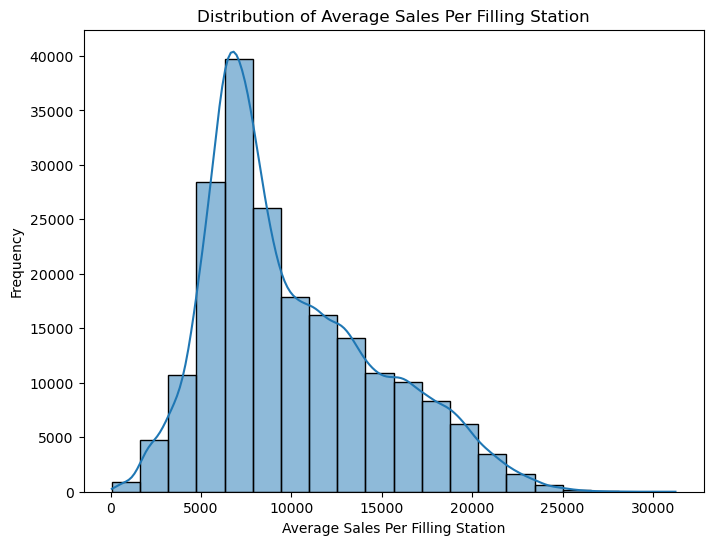

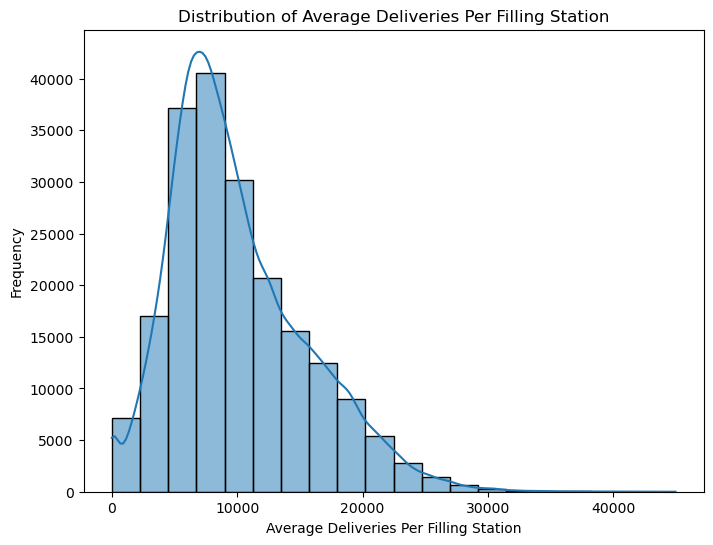

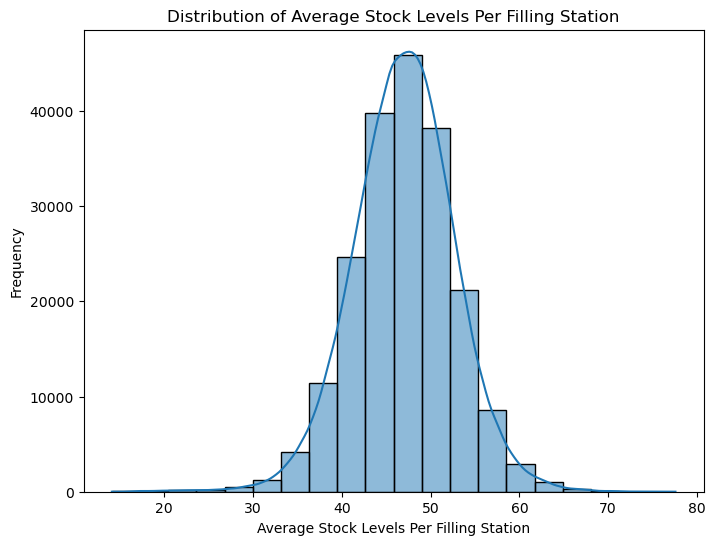

In [158]:
numerical_columns = ['Average Sales Per Filling Station', 
                     'Average Deliveries Per Filling Station', 
                     'Average Stock Levels Per Filling Station']

for column in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(data[column], kde=True, bins=20)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()


### B) To Find the relationship(Corelation).

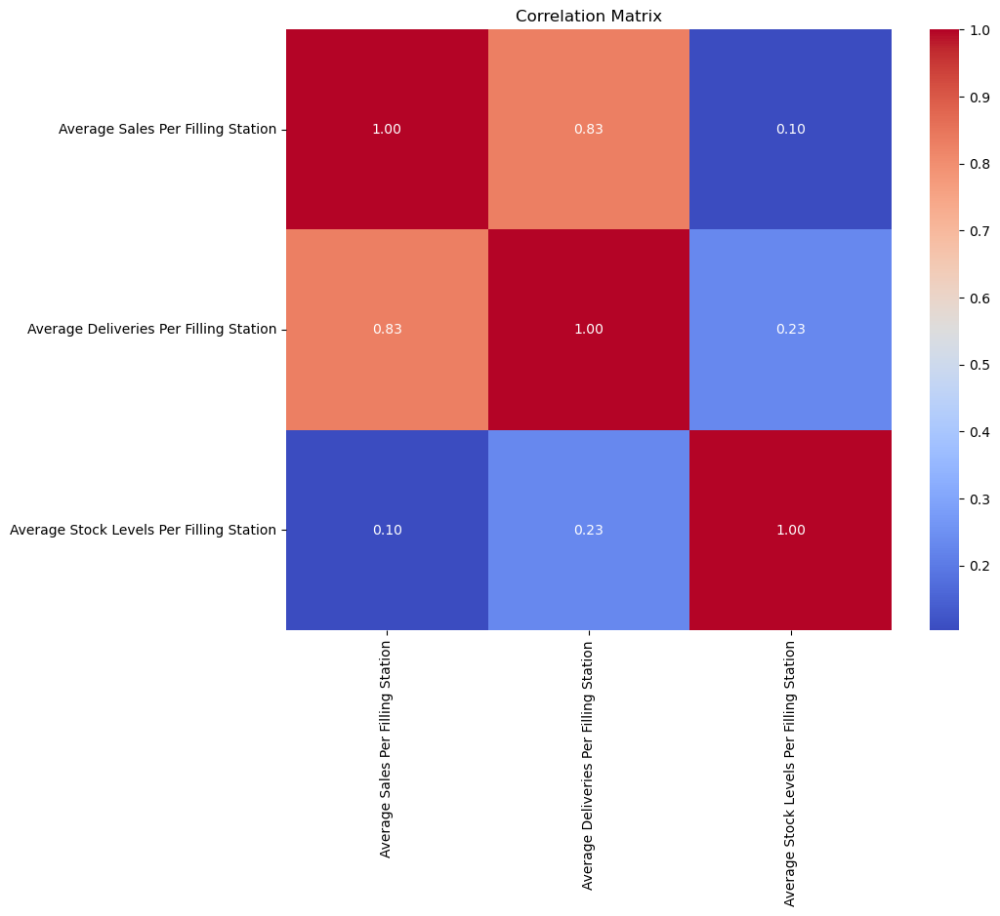

In [159]:
plt.figure(figsize=(10,8))
sns.heatmap(data[numerical_columns].corr(),annot=True,cmap='coolwarm',fmt='.2f')
plt.title("Correlation Matrix")
plt.show()

### C) To Visualize the Pairwise Relationship

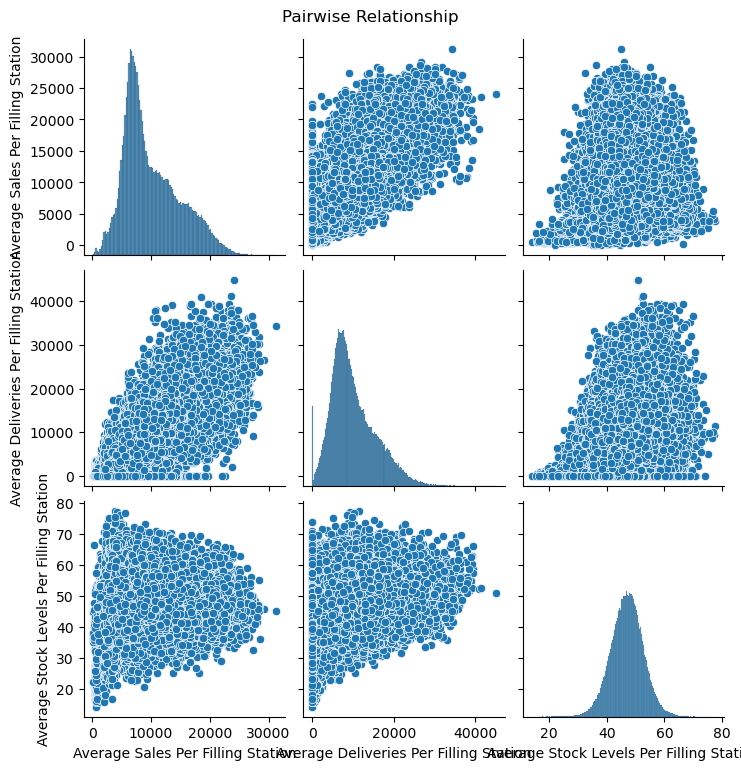

In [31]:
sns.pairplot(data[numerical_columns])
plt.suptitle("Pairwise Relationship",y=1.02)
plt.show()

### D) To Identify the weekly patterns .

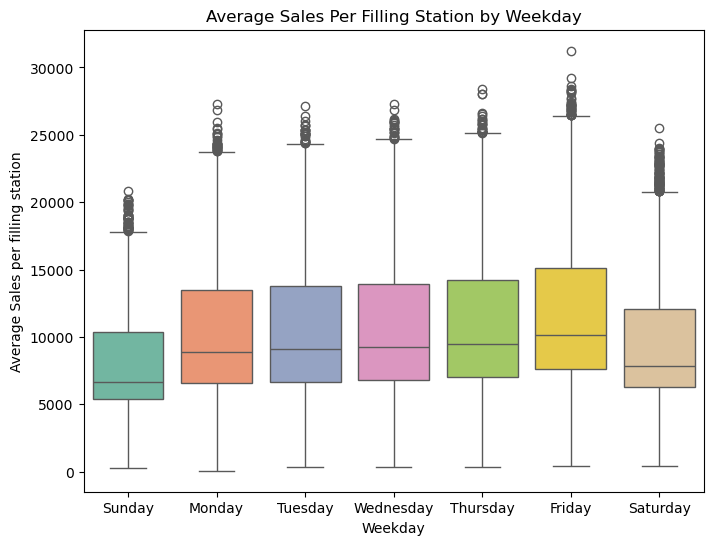

In [33]:
plt.figure(figsize=(8,6))
sns.boxplot(data=data,x='Weekday',y='Average Sales Per Filling Station', palette='Set2')
plt.title('Average Sales Per Filling Station by Weekday')
plt.xlabel('Weekday')
plt.ylabel('Average Sales per filling station')
plt.show()

### E) Using pandas plotting capabilities or other libraries to visualize.

#### Summary Statistics Visualzation

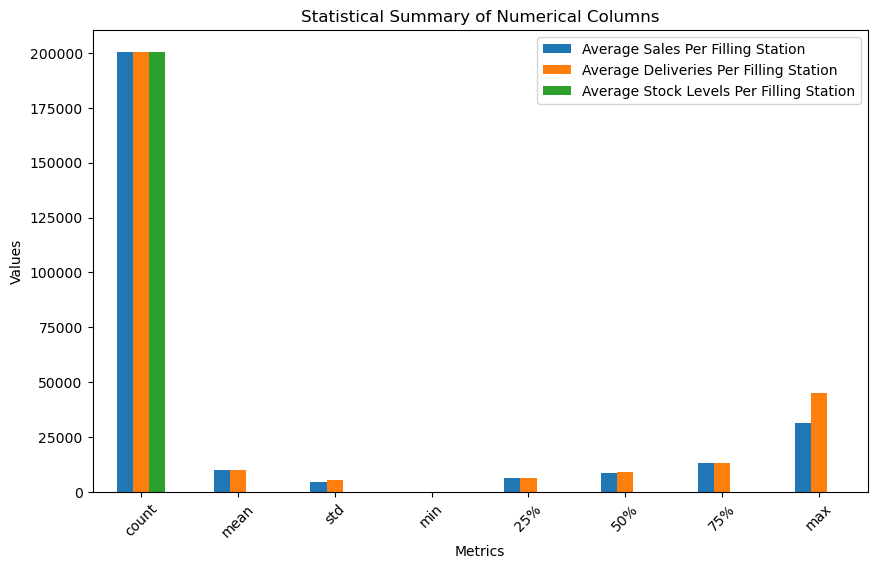

In [35]:
data.describe().plot(kind='bar',figsize=(10,6))
plt.title("Statistical Summary of Numerical Columns")
plt.ylabel('Values')
plt.xlabel('Metrics')
plt.xticks(rotation=45)
plt.show()

#### KDE plot

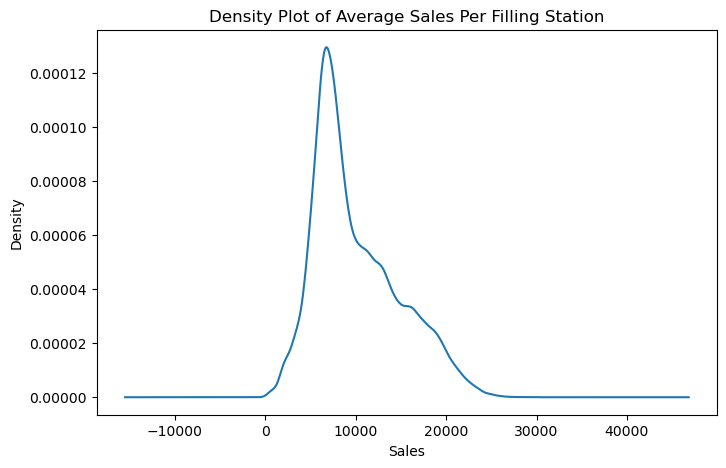

In [162]:
data['Average Sales Per Filling Station'].plot(kind='kde', figsize=(8,5))
plt.title('Density Plot of Average Sales Per Filling Station')
plt.xlabel('Sales')
plt.show()

## 3. Data Analysis

### Converting Datatype from Object to datetime

In [164]:
data['Date']=pd.to_datetime(data['Date'], errors='coerce')
print(data['Date'].dtype)

datetime64[ns]


### Accessing the various parameters from the Date Column

In [166]:
data['Year']=data['Date'].dt.year
data['Month']=data['Date'].dt.month
data['Day']=data['Date'].dt.day
data['Weekday']=data['Date'].dt.weekday

### Assigning the all the dates in the date column to respective Quarters. i.e(Q1,Q2,Q3,Q4)

In [168]:
data['Quarter']=data['Month'].apply(lambda x: 'Q1' if x in [1,2,3] else
                                    ('Q2' if x in [4,5,6] else
                                     ('Q3' if x in [7,8,9] else 'Q4')))
data['Quarter']

0         Q1
1         Q1
2         Q1
3         Q1
4         Q1
          ..
200381    Q4
200382    Q4
200383    Q4
200384    Q4
200385    Q4
Name: Quarter, Length: 200386, dtype: object

### Now we can access the date in quarter wise

In [90]:
data

,Date,Weekday,Fuel Type,ITL1 Name,ITL1 Code,ITL2 Name,ITL2 Code,ITL3 Name,ITL3 Code,Average Sales Per Filling Station,Average Deliveries Per Filling Station,Average Stock Levels Per Filling Station,Z_score,z_score,Year,Month,Day,Quarter
0,2023-01-01,6.0,Diesel,North East,TLC,Tees Valley and Durham,TLC1,Hartlepool and Stockton-on-Tees,TLC11,3165.0,4322.0,52.763595,NaN,NaN,2023.0,1.0,1.0,Q1
1,2023-01-01,6.0,Diesel,North East,TLC,Tees Valley and Durham,TLC1,South Teesside,TLC12,3519.0,3586.0,44.049048,NaN,NaN,2023.0,1.0,1.0,Q1
2,2023-01-01,6.0,Diesel,North East,TLC,Tees Valley and Durham,TLC1,Darlington,TLC13,3510.0,2786.0,47.057207,NaN,NaN,2023.0,1.0,1.0,Q1
3,2023-01-01,6.0,Diesel,North East,TLC,Tees Valley and Durham,TLC1,Durham,TLC14,2842.0,2509.0,46.821127,NaN,NaN,2023.0,1.0,1.0,Q1
4,2023-01-01,6.0,Diesel,North East,TLC,"Northumberland, and Tyne and Wear",TLC2,Northumberland,TLC21,2517.0,3550.0,58.556704,NaN,NaN,2023.0,1.0,1.0,Q1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200381,2023-12-31,6.0,Total,Scotland,TLM,Southern Scotland,TLM9,Dumfries and Galloway,TLM92,8844.0,9628.0,46.844354,NaN,NaN,2023.0,12.0,31.0,Q4
200382,2023-12-31,6.0,Total,Scotland,TLM,Southern Scotland,TLM9,East Ayrshire and North Ayrshire mainland,TLM93,11261.0,16169.0,56.495969,NaN,NaN,2023.0,12.0,31.0,Q4
200383,2023-12-31,6.0,Total,Scotland,TLM,Southern Scotland,TLM9,South Ayrshire,TLM94,9916.0,4748.0,43.689256,NaN,NaN,2023.0,12.0,31.0,Q4
200384,2023-12-31,6.0,Total,Scotland,TLM,Southern Scotland,TLM9,South Lanarkshire,TLM95,10604.0,7888.0,45.793925,NaN,NaN,2023.0,12.0,31.0,Q4


In [170]:
q1_data=data[data['Quarter']=='Q1']
print(q1_data)
q2_data=data[data['Quarter'] == 'Q2']
print(q2_data)
q3_data=data[data['Quarter']=='Q3']
print(q3_data)
q4_data=data[data['Quarter']=='Q4']
print(q4_data)

             Date  Weekday Fuel Type   ITL1 Name ITL1 Code  \
0      2023-01-01      6.0    Diesel  North East       TLC   
1      2023-01-01      6.0    Diesel  North East       TLC   
2      2023-01-01      6.0    Diesel  North East       TLC   
3      2023-01-01      6.0    Diesel  North East       TLC   
4      2023-01-01      6.0    Diesel  North East       TLC   
...           ...      ...       ...         ...       ...   
150055 2023-03-31      4.0     Total    Scotland       TLM   
150056 2023-03-31      4.0     Total    Scotland       TLM   
150057 2023-03-31      4.0     Total    Scotland       TLM   
150058 2023-03-31      4.0     Total    Scotland       TLM   
150059 2023-03-31      4.0     Total    Scotland       TLM   

                                ITL2 Name ITL2 Code  \
0                  Tees Valley and Durham      TLC1   
1                  Tees Valley and Durham      TLC1   
2                  Tees Valley and Durham      TLC1   
3                  Tees Valley and 

In [172]:
print(data['Date'])

0        2023-01-01
1        2023-01-01
2        2023-01-01
3        2023-01-01
4        2023-01-01
            ...    
200381   2023-12-31
200382   2023-12-31
200383   2023-12-31
200384   2023-12-31
200385          NaT
Name: Date, Length: 200386, dtype: datetime64[ns]


### Step 2: Feature Engineering

### Sales of per filling station on quarterly basis

In [174]:
quarterly_deliveries = data.groupby('Quarter')['Average Sales Per Filling Station'].mean()
print(quarterly_deliveries)

Quarter
Q1     9962.349383
Q2    10199.987570
Q3    10045.740932
Q4     9939.290508
Name: Average Sales Per Filling Station, dtype: float64


### Stock levels per filling station through ITL1 

In [176]:
region_max_stock = data.groupby('ITL1 Name')['Average Stock Levels Per Filling Station'].max()
print(region_max_stock)

ITL1 Name
East                        70.268290
East Midlands               66.969675
London                      77.570195
North East                  71.585995
North West                  68.870440
Northern Ireland            72.034652
Scotland                    73.732682
South East                  70.312775
South West                  68.533281
Wales                       65.486665
West Midlands               67.544958
Yorkshire and The Humber    67.810249
Name: Average Stock Levels Per Filling Station, dtype: float64


### Mean sales of respective Fuels 

In [178]:
fuel_type_summary = data.groupby('Fuel Type')['Average Sales Per Filling Station'].mean()
print(fuel_type_summary)

Fuel Type
Diesel     8268.042219
Petrol     6787.163410
Total     15055.204282
Name: Average Sales Per Filling Station, dtype: float64


### To Find the Sales Efficiency.

In [180]:
data['Sales Efficiency']=data['Average Sales Per Filling Station']/ data['Average Deliveries Per Filling Station']

### Step 3: Statistical Analysis

### 1.Which International Territory levels has the lowest sales

In [205]:

lowest_sales_ITL1 = data.groupby('ITL1 Name')['Average Sales Per Filling Station'].sum().idxmin()
lowest_sales_ITL2 = data.groupby('ITL2 Name')['Average Sales Per Filling Station'].sum().idxmin()
lowest_sales_ITL3 = data.groupby('ITL3 Name')['Average Sales Per Filling Station'].sum().idxmin()

lowest_sales_ITL1_value = data.groupby('ITL1 Name')['Average Sales Per Filling Station'].sum().min()
lowest_sales_ITL2_value = data.groupby('ITL2 Name')['Average Sales Per Filling Station'].sum().min()
lowest_sales_ITL3_value = data.groupby('ITL3 Name')['Average Sales Per Filling Station'].sum().min()

print(f"ITL1 with the lowest sales: {lowest_sales_ITL1} ({lowest_sales_ITL1_value})")
print(f"ITL2 with the lowest sales: {lowest_sales_ITL2} ({lowest_sales_ITL2_value})")
print(f"ITL3 with the lowest sales: {lowest_sales_ITL3} ({lowest_sales_ITL3_value})")


ITL1 with the lowest sales: Northern Ireland (56513963.0)
ITL2 with the lowest sales: Lincolnshire (10870315.0)
ITL3 with the lowest sales: Fermanagh and Omagh (2128487.0)


### 2. Tells us about sales distribution in an average and fuel type.

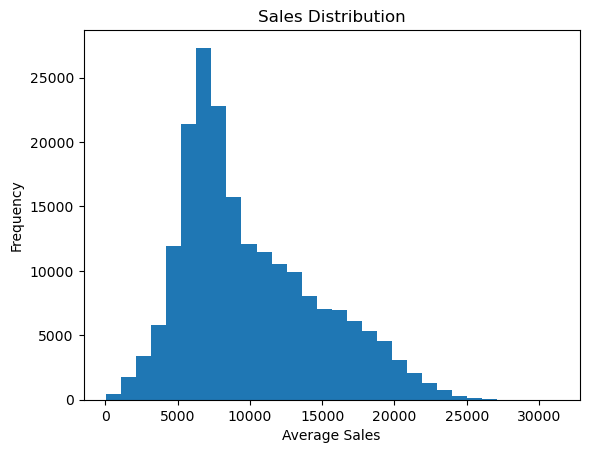

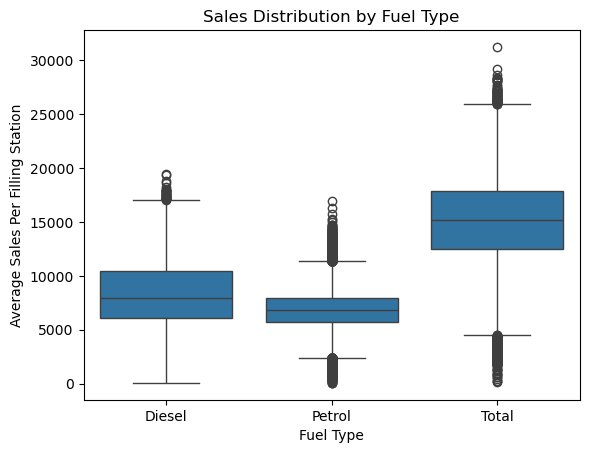

In [182]:
data['Average Sales Per Filling Station'].plot(kind='hist', bins=30, title='Sales Distribution')
plt.xlabel('Average Sales')
plt.show()

sns.boxplot(x='Fuel Type', y='Average Sales Per Filling Station', data=data)
plt.title('Sales Distribution by Fuel Type')
plt.show()

### 3. This chart indicates the 7 Day Rolling Average of Sales

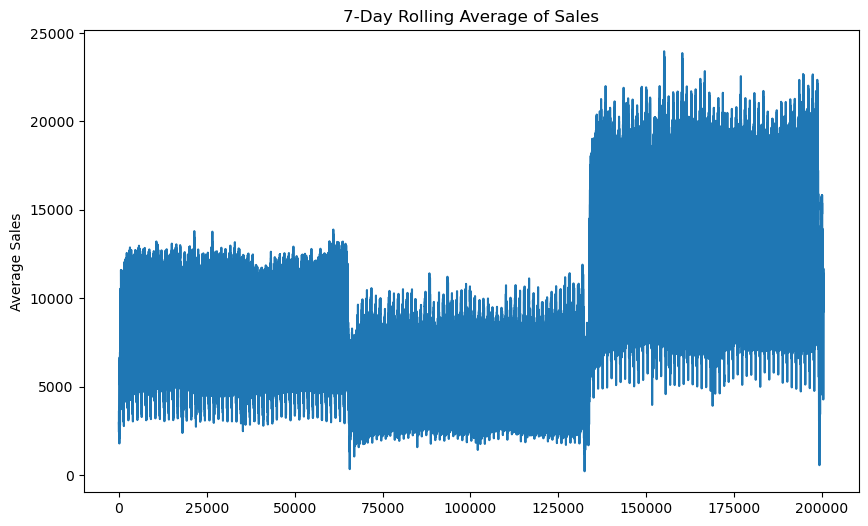

In [184]:
data['Rolling Sales'] = data['Average Sales Per Filling Station'].rolling(window=7).mean()

plt.figure(figsize=(10, 6))
data['Rolling Sales'].plot(title='7-Day Rolling Average of Sales')
plt.ylabel('Average Sales')
plt.show()



## Conclusion: 
### Sales Stabiltiy and Spikes: The Rolling average indicates relatively stable sales with sharp upward trends at certain points, likely due to promotions or external factors.
### While the large flucation may suggest a seasonal patterns or a recurring events influencing the sales. This particular period can be analyzed further to understand the the underlying the causes. By Identifying the high sales can help in planning future promotions,resource allocation,or investigating external events that triggered the surge.

## 4. Data Visualization 

### 1. To Find Which  Quarter had more sales.

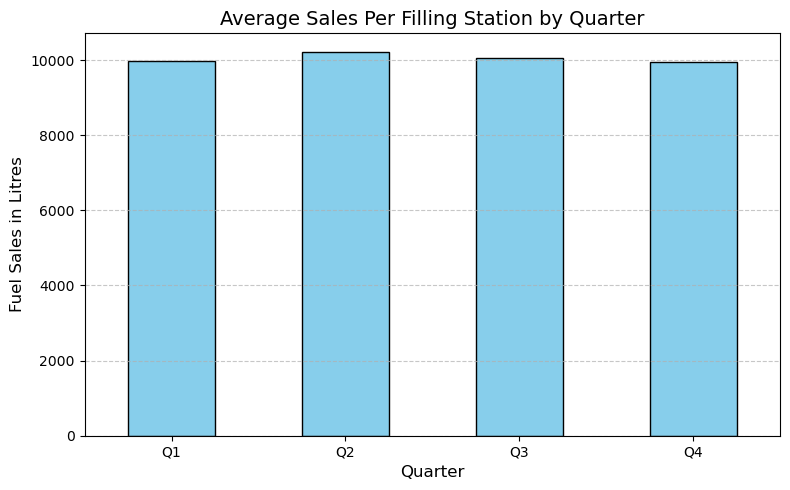

In [186]:
data['Date'] = pd.to_datetime(data['Date'])

data['Quarter'] = data['Date'].dt.month.map({
    1: 'Q1', 2: 'Q1', 3: 'Q1',
    4: 'Q2', 5: 'Q2', 6: 'Q2',
    7: 'Q3', 8: 'Q3', 9: 'Q3',
    10: 'Q4', 11: 'Q4', 12: 'Q4'
})

quarterly_sales = data.groupby('Quarter')['Average Sales Per Filling Station'].mean()

plt.figure(figsize=(8, 5))
quarterly_sales.plot(kind='bar', color='skyblue', edgecolor='black')

plt.title('Average Sales Per Filling Station by Quarter', fontsize=14)
plt.xlabel('Quarter', fontsize=12)
plt.ylabel('Fuel Sales in Litres', fontsize=12)
plt.xticks(rotation=0, fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()


### Conclusion: On Observing the above Bar Graph it can be understood that in Quarter 2  Fuel Stations had more sales of Fuel.

### 2. To see the trend  for fuel in particularly in Q2

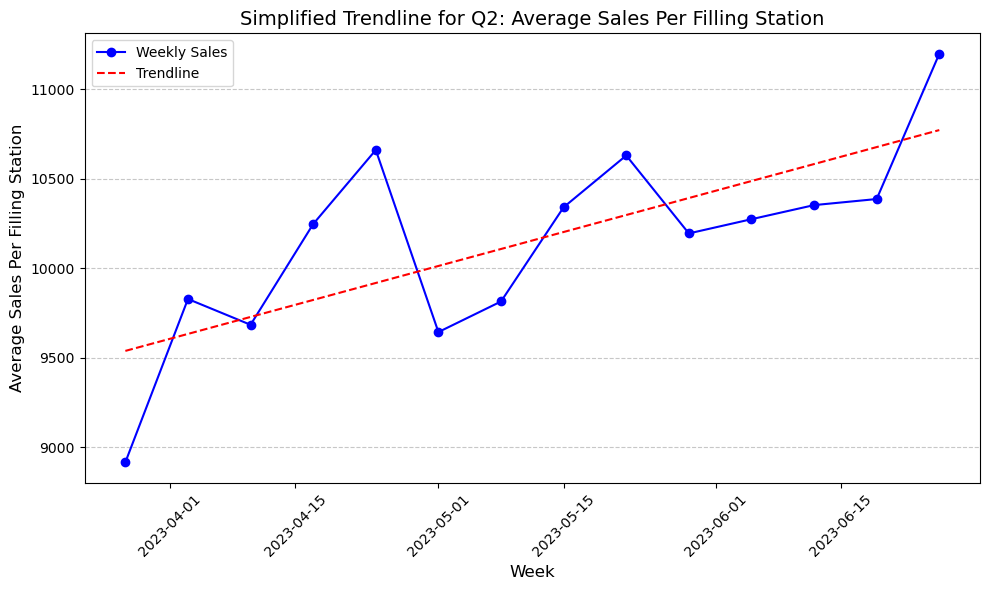

In [54]:
q2_data['Week'] = q2_data['Date'].dt.to_period('W')  
q2_weekly = q2_data.groupby('Week')['Average Sales Per Filling Station'].mean().reset_index()

q2_weekly['Week'] = q2_weekly['Week'].dt.start_time

x = np.arange(len(q2_weekly)) 
y = q2_weekly['Average Sales Per Filling Station']


z = np.polyfit(x, y, 1)  
p = np.poly1d(z)

plt.figure(figsize=(10, 6))
plt.plot(q2_weekly['Week'], y, marker='o', linestyle='-', color='blue', label='Weekly Sales')

plt.plot(q2_weekly['Week'], p(x), linestyle='--', color='red', label='Trendline')

plt.title('Simplified Trendline for Q2: Average Sales Per Filling Station', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Average Sales Per Filling Station', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()


### Conclusion: It is Observed that requriment for the fuel increased over time throughout the week.

### 3. HeatMap to identify which Fuel Type has most sales and which has least sales with respect to Quarters

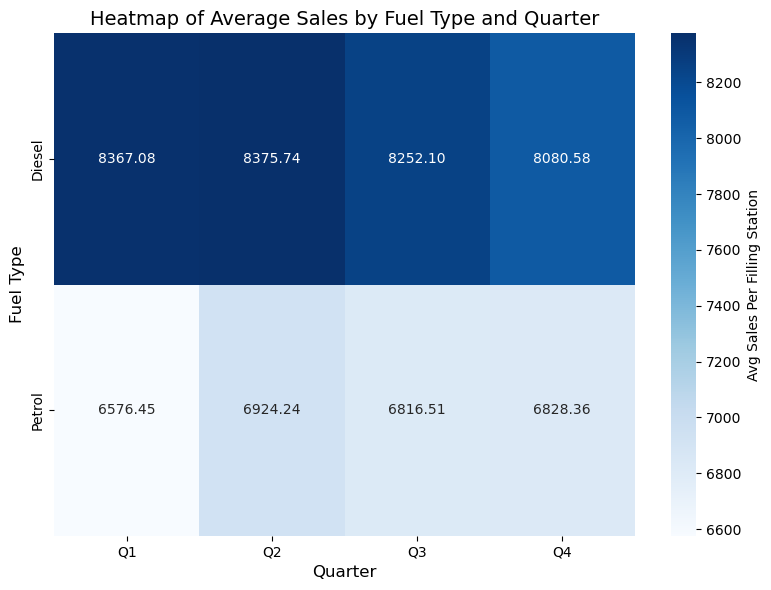

In [61]:

filtered_data = data[data['Fuel Type'] != 'Total']
filtered_heatmap_data = filtered_data.groupby(['Fuel Type', 'Quarter'])['Average Sales Per Filling Station'].mean().unstack()

plt.figure(figsize=(8, 6))
sns.heatmap(filtered_heatmap_data, annot=True, fmt=".2f", cmap="Blues", cbar_kws={'label': 'Avg Sales Per Filling Station'})

plt.title('Heatmap of Average Sales by Fuel Type and Quarter', fontsize=14)
plt.xlabel('Quarter', fontsize=12)
plt.ylabel('Fuel Type', fontsize=12)
plt.tight_layout()
plt.show()


### Conclusion: On Observing the Heat Map we understand that the consumption for diesel was more during the Q1 and the consumption for petrol was highest in the Q2

### 4.  A Time Series chart made with the plotly library , which is an interactive chart that tells us about the average sales of the fuels throughout the year.

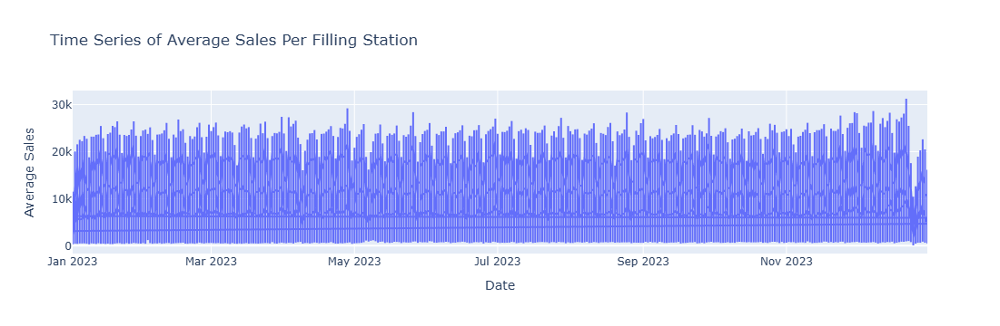

In [93]:
fig = px.line(data, x='Date', y='Average Sales Per Filling Station', title='Time Series of Average Sales Per Filling Station')
fig.update_xaxes(title='Date')
fig.update_yaxes(title='Average Sales')
fig.show()

### Conclusion:This Line chart indicates the average sales of the fuels per filling stations. And we can see dip in the sales of the fuels due to lower demand of oil and greater pound rate during the month of December.

### 5. Violin Plot For Distribution of Sales by Fuel Types

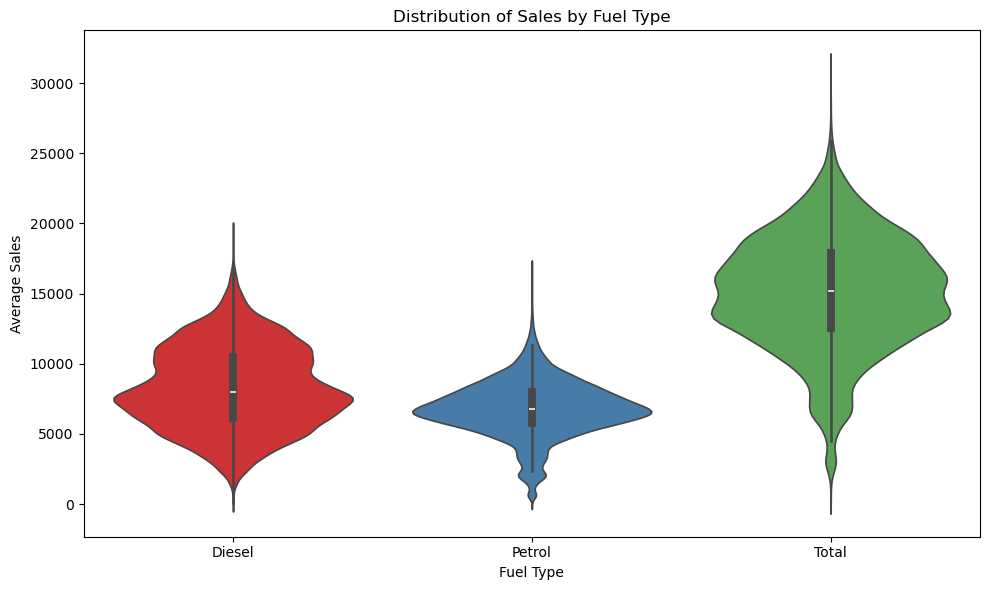

In [106]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='Fuel Type', y='Average Sales Per Filling Station', data=data, palette='Set1')
plt.title('Distribution of Sales by Fuel Type')
plt.xlabel('Fuel Type')
plt.ylabel('Average Sales')
plt.tight_layout()
plt.show()

### Conclusion: This Violin chart indicates that the majority of the sales is contributes by diesel itself.

### 6. A line plot for visualizing the average deliveries to the filling station.


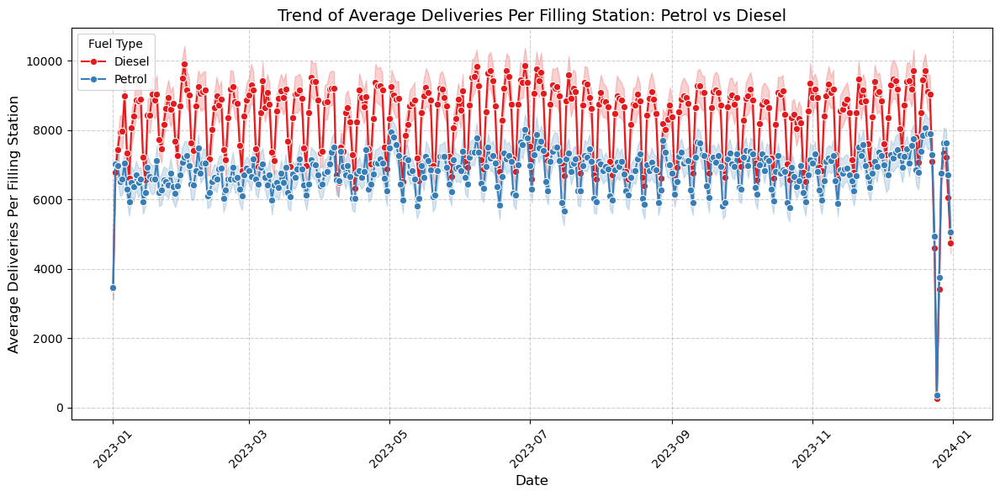

In [247]:
petrol_diesel_data = data[data["Fuel Type"].isin(["Petrol", "Diesel"])]

plt.figure(figsize=(12, 6))

sns.lineplot(
    data=petrol_diesel_data,
    x="Date",
    y="Average Deliveries Per Filling Station",
    hue="Fuel Type",
    marker="o",
    palette="Set1"
)

plt.title("Trend of Average Deliveries Per Filling Station: Petrol vs Diesel", fontsize=14)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Average Deliveries Per Filling Station", fontsize=12)
plt.xticks(rotation=45)
plt.legend(title="Fuel Type")
plt.grid(visible=True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()


### Conclusion : On Observing the above trendline chart we realize that the need of Diesel is very high compared to the petrol and also the sales of both petrol and diesel has seen sudden dip in the year 2024. Due to the lower global demand for oil and a stronger pound.

### 7. A Horizontal Bar chart indicating the lowest sales of fuel was in the region.

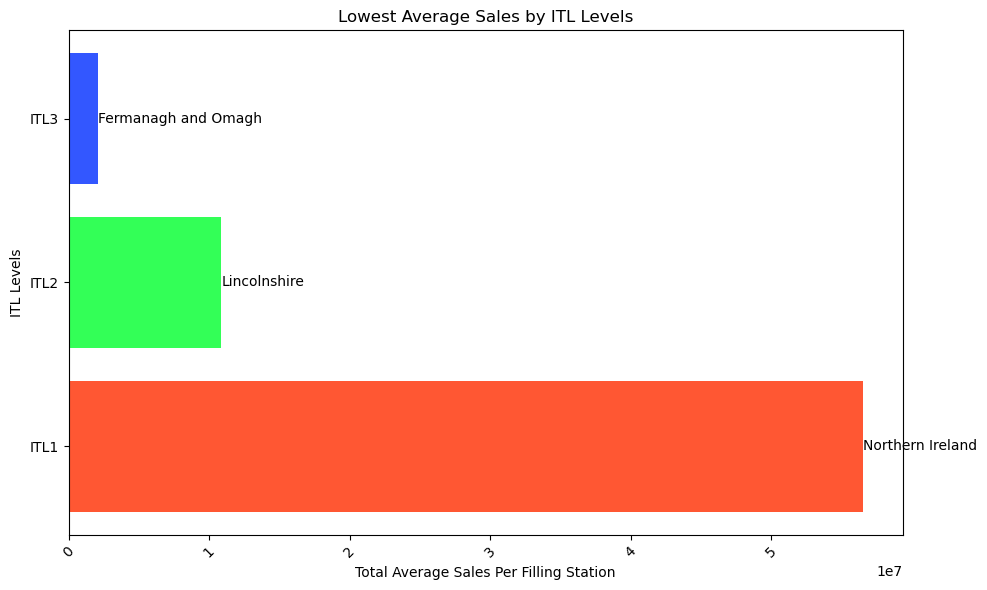

In [207]:
itl1_sales = data.groupby('ITL1 Name')['Average Sales Per Filling Station'].sum()
itl2_sales = data.groupby('ITL2 Name')['Average Sales Per Filling Station'].sum()
itl3_sales = data.groupby('ITL3 Name')['Average Sales Per Filling Station'].sum()

lowest_itl1 = itl1_sales.idxmin()
lowest_itl2 = itl2_sales.idxmin()
lowest_itl3 = itl3_sales.idxmin()

lowest_sales_data = pd.DataFrame({
    "ITL Level": ["ITL1", "ITL2", "ITL3"],
    "Region": [lowest_itl1, lowest_itl2, lowest_itl3],
    "Sales": [itl1_sales.min(), itl2_sales.min(), itl3_sales.min()]
})


plt.figure(figsize=(10, 6))
plt.barh(lowest_sales_data["ITL Level"], lowest_sales_data["Sales"], color=['#FF5733', '#33FF57', '#3357FF'])


plt.xlabel("Total Average Sales Per Filling Station")
plt.ylabel("ITL Levels")
plt.title("Lowest Average Sales by ITL Levels")
plt.xticks(rotation=45)


for index, value in enumerate(lowest_sales_data["Sales"]):
    plt.text(value + 10, index, lowest_sales_data["Region"][index], va='center', fontsize=10, color='black')

plt.tight_layout()
plt.show()


### Conclusion: This chart tells us which region has the lowest sales of fuel. It is also recommended to look into these regions why the sales of the fuels are low.

### 8. A Horizontal Bar chart  that is used to visualize average stock levels of the the region(ITL1,ITL2,ITL3)

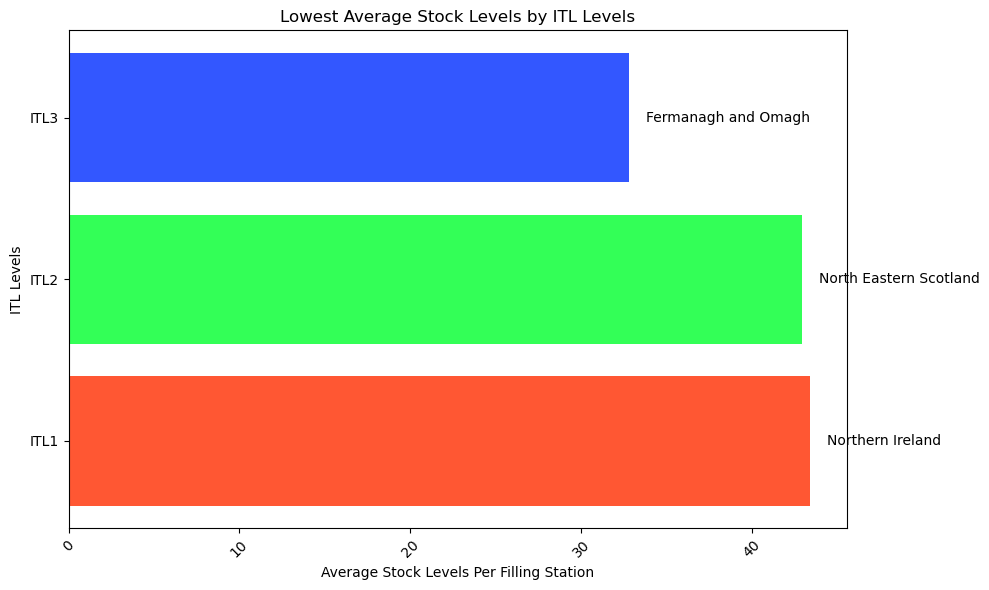

In [212]:
import matplotlib.pyplot as plt

itl1_stock = data.groupby('ITL1 Name')['Average Stock Levels Per Filling Station'].mean()
itl2_stock = data.groupby('ITL2 Name')['Average Stock Levels Per Filling Station'].mean()
itl3_stock = data.groupby('ITL3 Name')['Average Stock Levels Per Filling Station'].mean()

lowest_itl1_stock = itl1_stock.idxmin()
lowest_itl2_stock = itl2_stock.idxmin()
lowest_itl3_stock = itl3_stock.idxmin()

lowest_stock_data = pd.DataFrame({
    "ITL Level": ["ITL1", "ITL2", "ITL3"],
    "Region": [lowest_itl1_stock, lowest_itl2_stock, lowest_itl3_stock],
    "Stock Levels": [itl1_stock.min(), itl2_stock.min(), itl3_stock.min()]
})

plt.figure(figsize=(10, 6))
plt.barh(lowest_stock_data["ITL Level"], lowest_stock_data["Stock Levels"], color=['#FF5733', '#33FF57', '#3357FF'])

plt.xlabel("Average Stock Levels Per Filling Station")
plt.ylabel("ITL Levels")
plt.title("Lowest Average Stock Levels by ITL Levels")
plt.xticks(rotation=45)

for index, value in enumerate(lowest_stock_data["Stock Levels"]):
    plt.text(value + 1, index, lowest_stock_data["Region"][index], va='center', fontsize=10, color='black')

plt.tight_layout()
plt.show()


### Conclusion: This indicates what regions of ITL levels has the lowest stock levels per filling station

## 5. Conclusion and Recommendations

###  To Summarize the insights 
#### 1. The Average Sales Per Filling Station in terms of Quarters
####  The Q2 has the maximum sales of Fuels.
#### 2.The Trendline chart 
###  The requirement for the fuels is gradually increasing overtime throughout the weeks of Quarters
### 3. The Heatmap chart 
####  On Observing the chart we come to a conclusion that the overall sales of the fuel was largely dominated by diesel that is 56% and 44% by the petrol and throughout the complete sales of fuel the diesel sales are high compared to the petrol.
### 4. The Line Chart
####  On Observing the line chart the sales of the fuels saw a sudden dip on 22 Dec,2023 falling from 31.243K to 9.3K on 23 Dec,2023.
#### Due to the following the reasons 
#### Lower oil prices: Global oil prices fell, which led to lower wholesale fuel costs 
#### Stronger pound: The pound's value increased, which also contributed to the drop in fuel prices 
#### Lower demand: Global demand for oil decreased
## For Recommendation
#### Stock Optimization: Suggest stocking patterns for underperforming regions or fuel types.
#### Resource Allocation: Propose strategic delivery scheduling for regions with higher demand.
#### Optimize supply chain management.
#### Improve customer satisfaction by addressing low-performing areas.
#### Investigating seasonal patterns and their impact on stock levels.
#### Using predictive modeling to forecast future sales or demand.


## 6. Methodology Explanation and documentation

### Challenges Encountered 
#### 1. Duplicate Rows
#### The dataset contained duplicate entries, which could skew results and analyses.
#### 2. Repetitive Dates
#### Dates were repeated multiple times, causing issues when aggregating data by specific
#### time periods(Eg: Quarters)
#### 3. Empty DataFrame During Outlier Detection
#### When attempting to detect outliers using z-scores, the output was an empty dataframe
#### ,leading to the challenge of verifying if outliers really existed or not.
#### 4. Data Types and Conversions
#### Certain columns were stored as incorrect data types(eg, dates as strings) which caused errors during operations like filtering by quarters or using.dt accessor.
#### 5. Overly Densed Visulaization
#### Some visualization like line plot,appreared cluttered and difficult to interpret due to too many points.
#### 6. Challenges faced during regional analysis
#### Using Local based data(ITL codes) for detailed regional analysis needed thoughful grouping and visualization techniques.

### Solution Implemented
### 1. Handling Duplicates
#### Removed duplicate rows using drop_duplicates() to ensure the integrity of the dataset.
### 2. Aggregating Data
#### Aggregated repeated dates by applying functions like groupby() and aggregating metrics.
### 3. Outliers Confirmation
#### Verified the absence of outliers when z-score yielded an empty dataframe,concluding the data was well distributed
### 4.Data Type Correction
#### COnverted Columns to appropriate data types pd.to_datetime() for dates,astypes() for categorical variables ) to enable correct Operations and analyses.
### 5. Improving Visualizations
#### Reduced clutter by using aggregated views.(eg, average sales per quarter or regional grouping) and alternative charts like heatmaps and scatter plots to communicate pattern more clearly.
### 6.Regional Analysis Strategies 
#### Grouped ITL codes into hierarchical levels(ITL1,ITL2,ITL3) and used heatmaps and boxplots to uncover patterns in regional data.
### 7. Handling Complex Columns 
#### Created derived columns like "Quarters" and "Month" to simplify temporal analyses and improve visualization clarity.



## References
### Pandas
#### The Pandas Development Team (2023) Pandas: Python data analysis library. Available at: https://pandas.pydata.org (Accessed: 3 December 2024).

### NumPy
#### Harris, C.R., Millman, K.J., van der Walt, S.J., et al. (2020) 'Array programming with NumPy', Nature, 585, pp. 357–362. Available at: https://numpy.org (Accessed: 3 December 2024).

### Matplotlib
#### Hunter, J.D. (2007) 'Matplotlib: A 2D graphics environment', Computing in Science & Engineering, 9(3), pp. 90–95. Available at: https://matplotlib.org (Accessed: 3 December 2024).

### Seaborn
#### Waskom, M.L. (2021) 'Seaborn: Statistical data visualization', Journal of Open Source Software, 6(60), p. 3021. Available at: https://seaborn.pydata.org (Accessed: 3 December 2024).

### Plotly
#### Plotly Technologies Inc. (2023) Plotly: Open-source graphing library for Python. Available at: https://plotly.com/python/ (Accessed: 3 December 2024).